In [2]:
!pip install librosa

  Using cached pycparser-3.0-py3-none-any.whl.metadata (8.2 kB)
   ---------------------------------------- 0.0/2.8 MB ? eta -:--:--
   --------------------------------- ------ 2.4/2.8 MB 11.2 MB/s eta 0:00:01
   ---------------------------------------- 2.8/2.8 MB 10.2 MB/s  0:00:00
   ---------------------------------------- 0.0/41.9 MB ? eta -:--:--
   -- ------------------------------------- 2.6/41.9 MB 11.6 MB/s eta 0:00:04
   ---- ----------------------------------- 5.0/41.9 MB 11.6 MB/s eta 0:00:04
   ------- -------------------------------- 7.6/41.9 MB 11.7 MB/s eta 0:00:03
   --------- ------------------------------ 10.2/41.9 MB 11.8 MB/s eta 0:00:03
   ------------ --------------------------- 12.6/41.9 MB 11.6 MB/s eta 0:00:03
   -------------- ------------------------- 14.7/41.9 MB 11.7 MB/s eta 0:00:03
   --------------- ------------------------ 16.5/41.9 MB 10.8 MB/s eta 0:00:03
   ------------------ --------------------- 18.9/41.9 MB 10.9 MB/s eta 0:00:03
   --------------


[notice] A new release of pip is available: 25.3 -> 26.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
# Usual Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn

# Librosa (the mother of audio files)
import librosa
import librosa.display
import IPython.display as ipd
import warnings
import os

In [5]:
print(list(os.listdir(f'Data/genres_original/')))

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


In [6]:
y,sr=librosa.load(f'Data/genres_original/reggae/reggae.00000.wav')
print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

y: [ 0.01037598  0.00775146  0.03887939 ... -0.06652832 -0.05062866
 -0.03564453] 

y shape: (661794,) 

Sample Rate (KHz): 22050 



In [7]:
print('Check Len of Audio:', 661794/22050)

Check Len of Audio: 30.013333333333332


In [8]:
audio_file,_=librosa.effects.trim(y)
print('Audio File:', audio_file, '\n')
print('Audio File shape:', np.shape(audio_file))

Audio File: [ 0.01037598  0.00775146  0.03887939 ... -0.06652832 -0.05062866
 -0.03564453] 

Audio File shape: (661794,)


Text(0.5, 1.0, 'Sound waves in reggae 00')

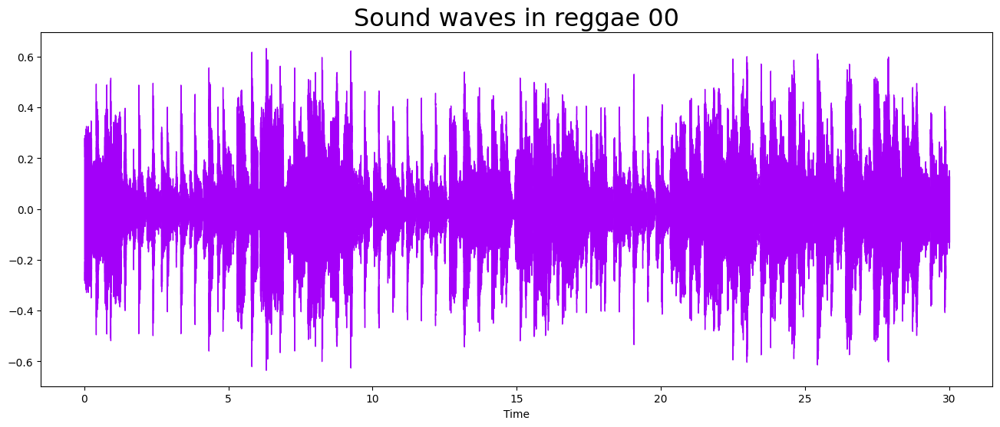

In [11]:
plt.figure(figsize=(16,6))
librosa.display.waveshow(audio_file, sr=sr, color="#A300F9")
plt.title("Sound waves in reggae 00",fontsize=23)

In [12]:
n_fft=2048
hop_length=512
D=np.abs(librosa.stft(audio_file,n_fft=n_fft,hop_length=hop_length))
print('shape of d object:',np.shape(D))


shape of d object: (1025, 1293)


 ...]

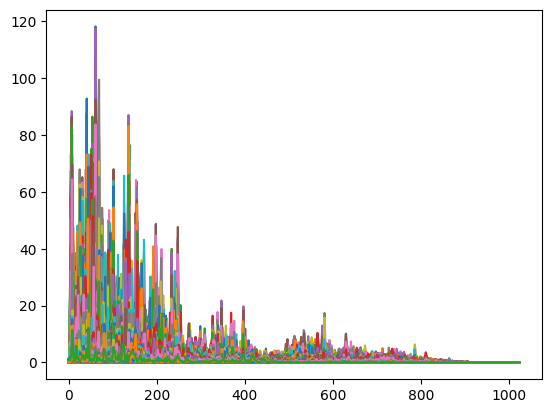

In [13]:
plt.Figure(figsize=(16,6))
plt.plot(D)

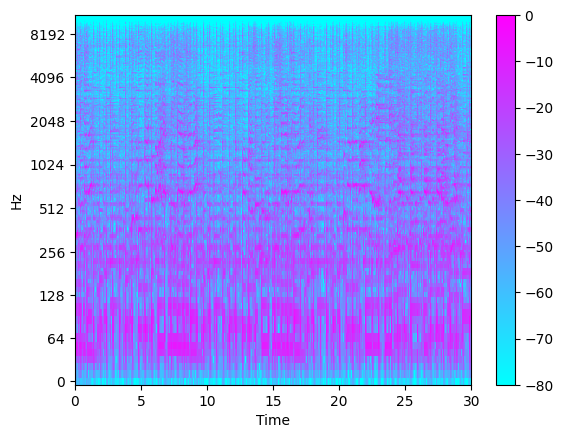

In [14]:
DB=librosa.amplitude_to_db(D,ref=np.max)
plt.Figure(figsize=(16,6))
librosa.display.specshow(DB,sr=sr,hop_length=hop_length,x_axis='time',y_axis='log',cmap='cool')
plt.colorbar()

Text(0.5, 1.0, 'Metal Mel Spectrogram')

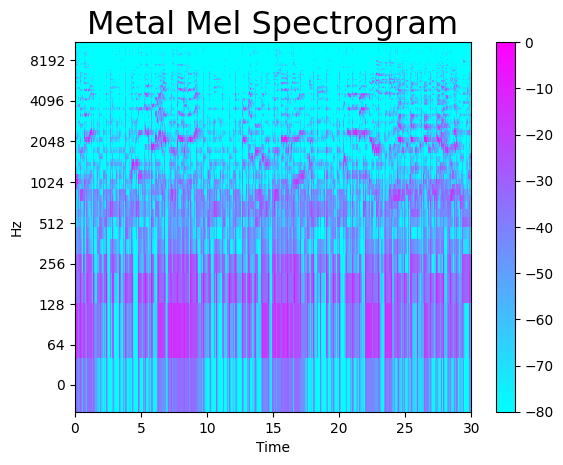

In [21]:
y,_=librosa.effects.trim(y)
S = librosa.feature.melspectrogram(y=y, sr=sr)
S_DB=librosa.amplitude_to_db(S,ref=np.max)
plt.Figure(figsize=(16,6))
librosa.display.specshow(S_DB,sr=sr,hop_length=hop_length,x_axis='time',y_axis='log',cmap='cool')
plt.colorbar()
plt.title("Metal Mel Spectrogram",fontsize=23)

Text(0.5, 1.0, 'clasical Mel Spectrogram')

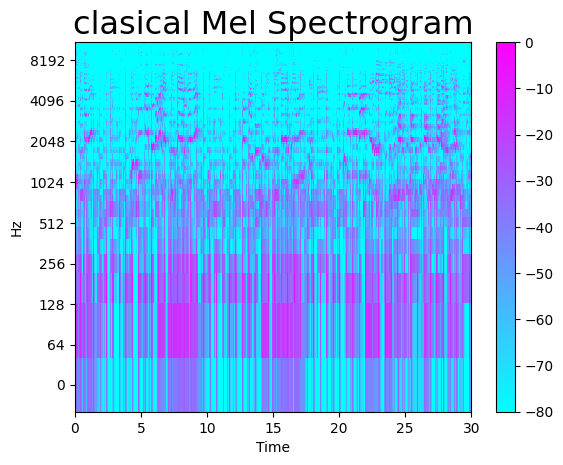

In [23]:
y,_=librosa.effects.trim(y)
S = librosa.feature.melspectrogram(y=y, sr=sr)
S_DB=librosa.amplitude_to_db(S,ref=np.max)
plt.Figure(figsize=(16,6))
librosa.display.specshow(S_DB,sr=sr,hop_length=hop_length,x_axis='time',y_axis='log',cmap='cool')
plt.colorbar()
plt.title("clasical Mel Spectrogram",fontsize=23)

In [24]:
zero_crossing=librosa.zero_crossings(audio_file,pad=False)
print(sum(zero_crossing))

64827


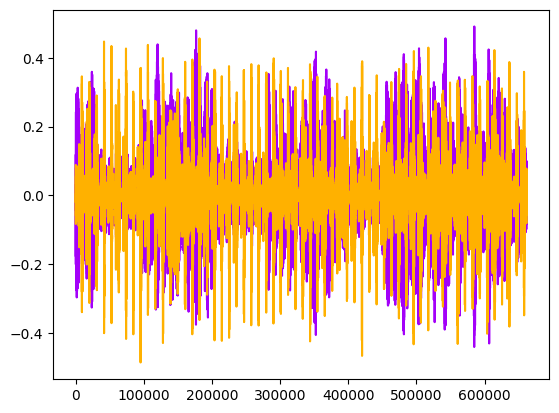

In [25]:
y_harm,y_perc=librosa.effects.hpss(audio_file)
plt.Figure(figsize=(16,6))
plt.plot(y_harm,color="#A300F9")
plt.plot(y_perc,color="#FFB100")

In [27]:
tempo,_=librosa.beat.beat_track(y=y,sr=sr)
tempo

array([123.046875])

In [29]:
spectral_centroids = librosa.feature.spectral_centroid(
    y=audio_file,
    sr=sr
)[0]
print("Centroids:",spectral_centroids,'\n')
print('Shape of Spectral Centroids:', spectral_centroids.shape, '\n')

Centroids: [2390.51647755 2694.97464269 2734.69275584 ... 2039.58289825 2050.92006153
 1988.22061731] 

Shape of Spectral Centroids: (1293,) 



In [30]:
frame=range(len(spectral_centroids))
t=librosa.frames_to_time(frame)
print('frame :',frame)
print('t :',t)
def normalize(x,axis=0):
    return sklearn.preprocessing.minmax_scale(x,axis=axis)

frame : range(0, 1293)
t : [0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 2.99537415e+01
 2.99769615e+01 3.00001814e+01]


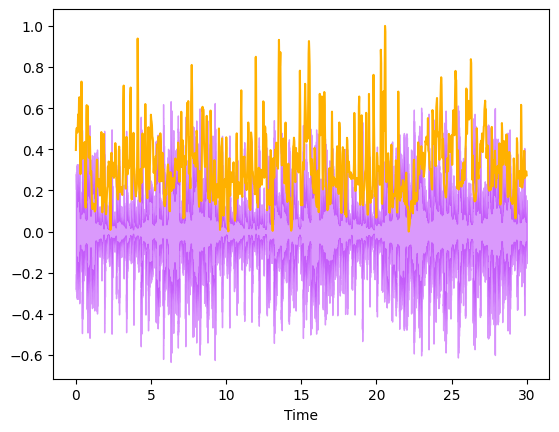

In [33]:
plt.Figure(figsize=(16,6))
librosa.display.waveshow(
    audio_file,
    sr=sr,
    alpha=0.4,
    color="#A300F9"
)
plt.plot(t,normalize(spectral_centroids),color="#FFB100")

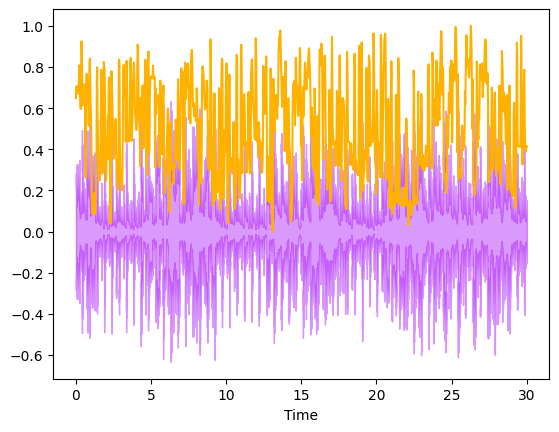

In [34]:
spectral_rolloff=librosa.feature.spectral_rolloff(
    y=audio_file,
    sr=sr
)[0]
plt.Figure(figsize=(16,6))
librosa.display.waveshow(
    y=audio_file,
    sr=sr,
    alpha=0.4,
    color="#A300F9"
)
plt.plot(t,normalize(spectral_rolloff),color="#FFB100")

mfccs shape:  (20, 1293)


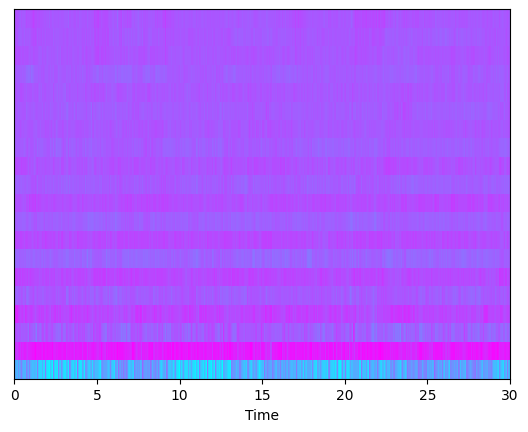

In [36]:
mfccs=librosa.feature.mfcc(
    y=audio_file,
    sr=sr
)
print("mfccs shape: ",mfccs.shape)
plt.Figure(figsize=(16,6))
librosa.display.specshow(
    data=mfccs,
    sr=sr,
    x_axis='time',
    cmap='cool'
)

Mean:  -1.7701611e-09
Var:  1.0000001


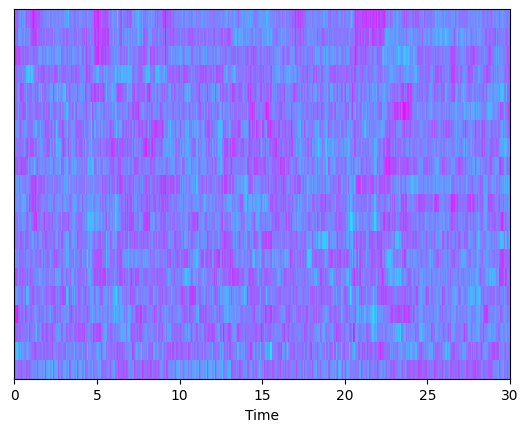

In [37]:
mfccs=sklearn.preprocessing.scale(mfccs,axis=1)
print('Mean: ',mfccs.mean())
print('Var: ',mfccs.var())
plt.Figure(figsize=(16,6))
librosa.display.specshow(
    data=mfccs,
    sr=sr,
    x_axis='time',
    cmap='cool'
)


Chromogram shape:  (12, 133)


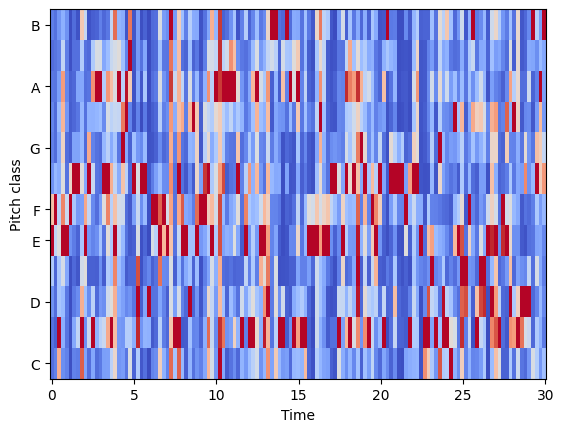

In [38]:
hop_length=5000
chromagram=librosa.feature.chroma_stft(
    y=audio_file,
    sr=sr,
    hop_length=hop_length
)
print('Chromogram shape: ',chromagram.shape)
plt.Figure(figsize=(16,6))
librosa.display.specshow(
    data=chromagram,
    x_axis='time',
    y_axis='chroma',
    hop_length=hop_length,
    cmap='coolwarm'
)

In [39]:
data = pd.read_csv(f'Data/features_30_sec.csv')
data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5, 25.5, 26.5, 27.5]),
 [Text(0, 0.5, 'chroma_stft_mean'),
  Text(0, 1.5, 'rms_mean'),
  Text(0, 2.5, 'spectral_centroid_mean'),
  Text(0, 3.5, 'spectral_bandwidth_mean'),
  Text(0, 4.5, 'rolloff_mean'),
  Text(0, 5.5, 'zero_crossing_rate_mean'),
  Text(0, 6.5, 'harmony_mean'),
  Text(0, 7.5, 'perceptr_mean'),
  Text(0, 8.5, 'mfcc1_mean'),
  Text(0, 9.5, 'mfcc2_mean'),
  Text(0, 10.5, 'mfcc3_mean'),
  Text(0, 11.5, 'mfcc4_mean'),
  Text(0, 12.5, 'mfcc5_mean'),
  Text(0, 13.5, 'mfcc6_mean'),
  Text(0, 14.5, 'mfcc7_mean'),
  Text(0, 15.5, 'mfcc8_mean'),
  Text(0, 16.5, 'mfcc9_mean'),
  Text(0, 17.5, 'mfcc10_mean'),
  Text(0, 18.5, 'mfcc11_mean'),
  Text(0, 19.5, 'mfcc12_mean'),
  Text(0, 20.5, 'mfcc13_mean'),
  Text(0, 21.5, 'mfcc14_mean'),
  Text(0, 22.5, 'mfcc15_mean'),
  Text(0, 23.5, 'mfcc16_mean'),
  Text(0, 24.5, 

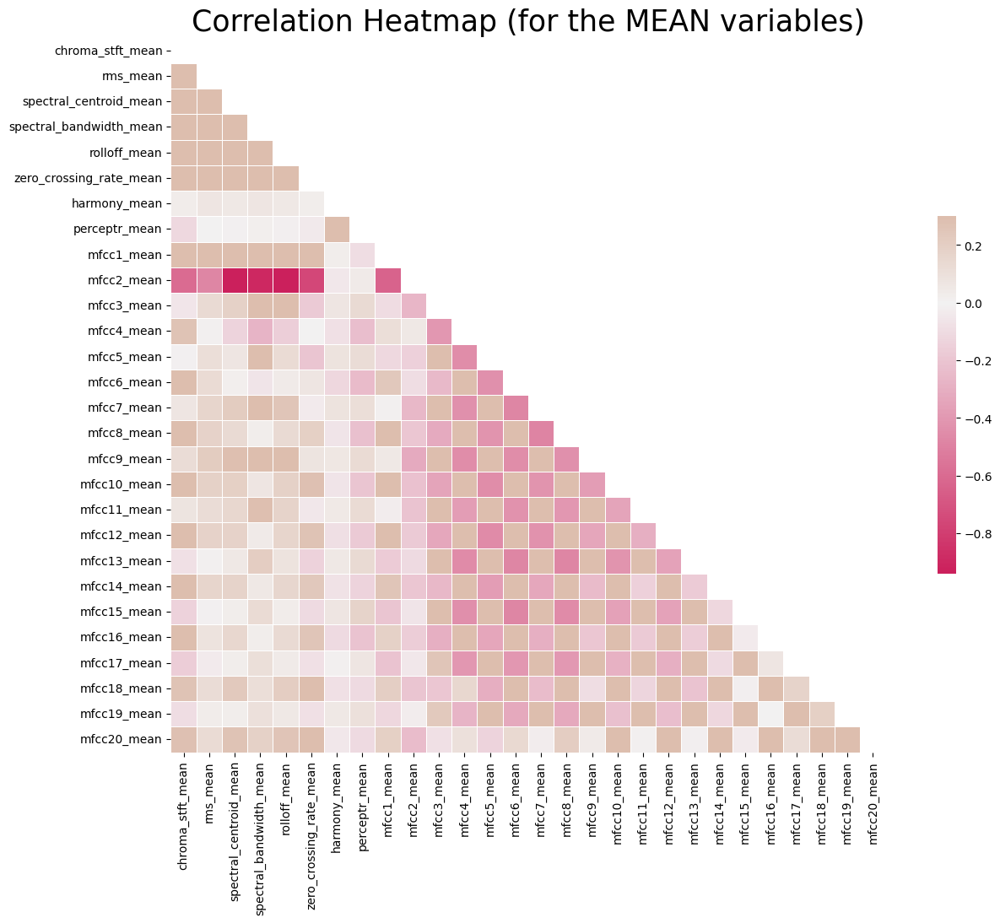

In [41]:
spike_cols=[col for col in data.columns if 'mean' in col]
corr =data[spike_cols].corr()
mask=np.triu(np.ones_like(corr,dtype=np.bool))
f, ax = plt.subplots(figsize=(16, 11))
cmap=sns.diverging_palette(0,25,as_cmap=True,s=90,l=45,n=5)
sns.heatmap(corr,mask=mask,cmap=cmap,vmax=.3,center=0,square=True,linewidths=.5,cbar_kws={"shrink":.5})
plt.title('Correlation Heatmap (for the MEAN variables)', fontsize = 25)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

Text(0, 0.5, 'BPM')

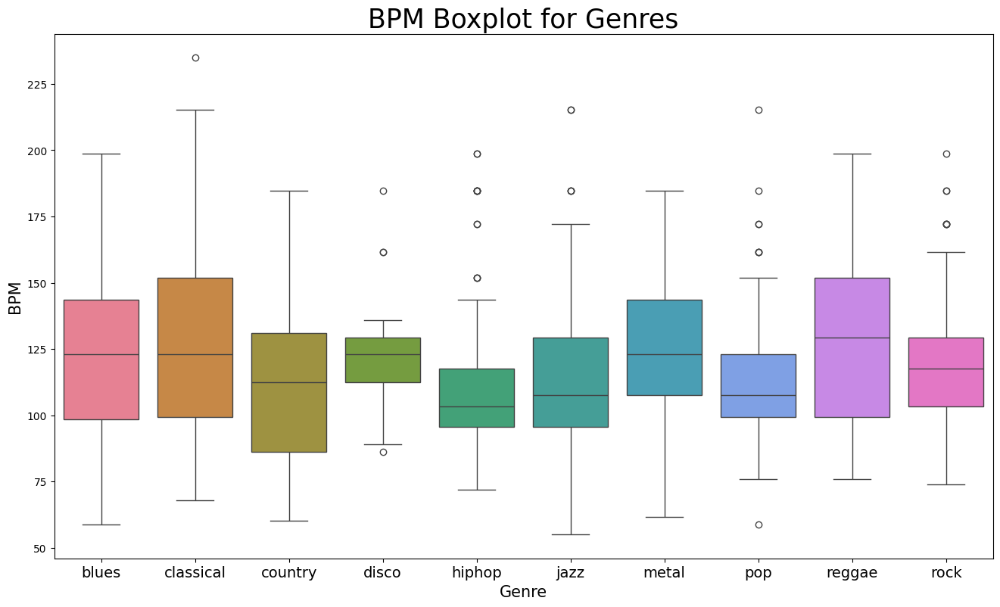

In [43]:
x=data[["label","tempo"]]
f,ax=plt.subplots(figsize=(16,9))
sns.boxplot(x="label",y="tempo",data=x,palette='husl')
plt.title('BPM Boxplot for Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BPM", fontsize = 15)

In [75]:
from sklearn import preprocessing
track_groups = data.iloc[:, 0].astype(str).str.rsplit('.', n=2).str[0]
data=data.iloc[0:,1:]
y=data['label']
X=data.loc[:,data.columns!='label']
label_encoder = preprocessing.LabelEncoder()
y_encoded = label_encoder.fit_transform(y)


In [76]:
cols=X.columns


In [46]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents=pca.fit_transform(X)
principalDf=pd.DataFrame(data=principalComponents,columns=['principal component 1','principal component 2'])
finaldf=pd.concat([principalDf,y],axis=1)
pca.explained_variance_ratio_

array([0.2439355 , 0.21781804])

Text(0, 0.5, 'Principal Component 2')

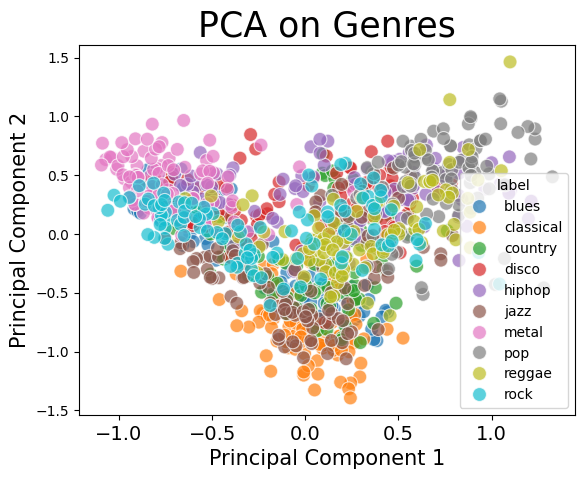

In [48]:
plt.Figure(figsize=(16,9))
sns.scatterplot(
    x="principal component 1",
    y="principal component 2",
    data=finaldf,
    hue="label",
    alpha=0.7,
    s=100
)
plt.title('PCA on Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Principal Component 1", fontsize = 15)
plt.ylabel("Principal Component 2", fontsize = 15)

In [50]:
!pip install xgboost

  Using cached xgboost-3.2.0-py3-none-win_amd64.whl.metadata (2.1 kB)
Using cached xgboost-3.2.0-py3-none-win_amd64.whl (101.7 MB)



[notice] A new release of pip is available: 25.3 -> 26.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [51]:
# from sklearn.naive_bayes import GaussianNB
# from sklearn.linear_model import SGDClassifier, LogisticRegression
# from sklearn.neighbors import KNeighborsClassifier
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.svm import SVC
# from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from xgboost import plot_tree, plot_importance

from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE

In [74]:
data=pd.read_csv(f'Data/features_3_sec.csv')
data.head()


,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [53]:
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)

In [54]:
X = pd.DataFrame(np_scaled, columns = cols)

In [ ]:


X_train, X_test, y_train, y_test = train_test_split(
    X,
    y_encoded,
    test_size=0.3,
    random_state=42,
)


In [83]:
def model_assess(model):
    model.fit(X_train, y_train,eval_metric='merror')
    preds = model.predict(X_test)
    print('Accuracy',':', round(accuracy_score(y_test, preds), 5), '\n')

In [89]:
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
xgb.fit(X_train, y_train)

preds = xgb.predict(X_test)
print('Accuracy', ':', round(accuracy_score(y_test, preds), 5), '\n')


Accuracy : 0.90257 



In [60]:
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
xgb.fit(X_train, y_train)


,"objective objective: typing.Union[str, xgboost.sklearn._SklObjWProto, typing.Callable[[typing.Any, typing.Any], typing.Tuple[numpy.ndarray, numpy.ndarray]], NoneType]Specify the learning task and the corresponding learning objective or a customobjective function to be used.For custom objective, see :doc:`/tutorials/custom_metric_obj` and:ref:`custom-obj-metric` for more information, along with the end note forfunction signatures.",'multi:softprob'
,"base_score base_score: typing.Union[float, typing.List[float], NoneType]The initial prediction score of all instances, global bias.",None
,booster,None
,"callbacks callbacks: typing.Optional[typing.List[xgboost.callback.TrainingCallback]]List of callback functions that are applied at end of each iteration.It is possible to use predefined callbacks by using:ref:`Callback API `... note:: States in callback are not preserved during training, which means callback objects can not be reused for multiple training sessions without reinitialization or deepcopy... code-block:: python for params in parameters_grid: # be sure to (re)initialize the callbacks before each run callbacks = [xgb.callback.LearningRateScheduler(custom_rates)] reg = xgboost.XGBRegressor(**params, callbacks=callbacks) reg.fit(X, y)",None
,colsample_bylevel colsample_bylevel: typing.Optional[float]Subsample ratio of columns for each level.,None
,colsample_bynode colsample_bynode: typing.Optional[float]Subsample ratio of columns for each split.,None
,colsample_bytree colsample_bytree: typing.Optional[float]Subsample ratio of columns when constructing each tree.,None
,"device device: typing.Optional[str].. versionadded:: 2.0.0Device ordinal, available options are `cpu`, `cuda`, and `gpu`.",None
,"early_stopping_rounds early_stopping_rounds: typing.Optional[int].. versionadded:: 1.6.0- Activates early stopping. Validation metric needs to improve at least once in every **early_stopping_rounds** round(s) to continue training. Requires at least one item in **eval_set** in :py:meth:`fit`.- If early stopping occurs, the model will have two additional attributes: :py:attr:`best_score` and :py:attr:`best_iteration`. These are used by the :py:meth:`predict` and :py:meth:`apply` methods to determine the optimal number of trees during inference. If users want to access the full model (including trees built after early stopping), they can specify the `iteration_range` in these inference methods. In addition, other utilities like model plotting can also use the entire model.- If you prefer to discard the trees after `best_iteration`, consider using the callback function :py:class:`xgboost.callback.EarlyStopping`.- If there's more than one item in **eval_set**, the last entry will be used for early stopping. If there's more than one metric in **eval_metric**, the last metric will be used for early stopping.",None
,enable_categorical enable_categorical: boolSee the same parameter of :py:class:`DMatrix` for details.,False
,"eval_metric eval_metric: typing.Union[str, typing.List[typing.Union[str, typing.Callable]], typing.Callable, NoneType].. versionadded:: 1.6.0Metric used for monitoring the training result and early stopping. It can be astring or list of strings as names of predefined metric in XGBoost (See:doc:`/parameter`), one of the metrics in :py:mod:`sklearn.metrics`, or anyother user defined metric that looks like `sklearn.metrics`.If custom objective is also provided, then custom metric should implement thecorresponding reverse link function.Unlike the `scoring` parameter commonly used in scikit-learn, when a callableobject is provided, it's assumed to be a cost function and by default XGBoostwill minimize the result during early stopping.For advanced usage on Early stopping like directly choosing to maximize insteadof minimize, see :py:obj:`xgboost.callback.EarlyStopping`.See :doc:`/tutorials/custom_metric_obj` and :ref:`custom-obj-metric` for moreinformation... code-block:: python from sklearn.datasets import load_diabetes f

In [90]:
preds = xgb.predict(X_test)

print('Accuracy', ':', round(accuracy_score(y_test, preds), 5), '\n')


Accuracy : 0.90257 



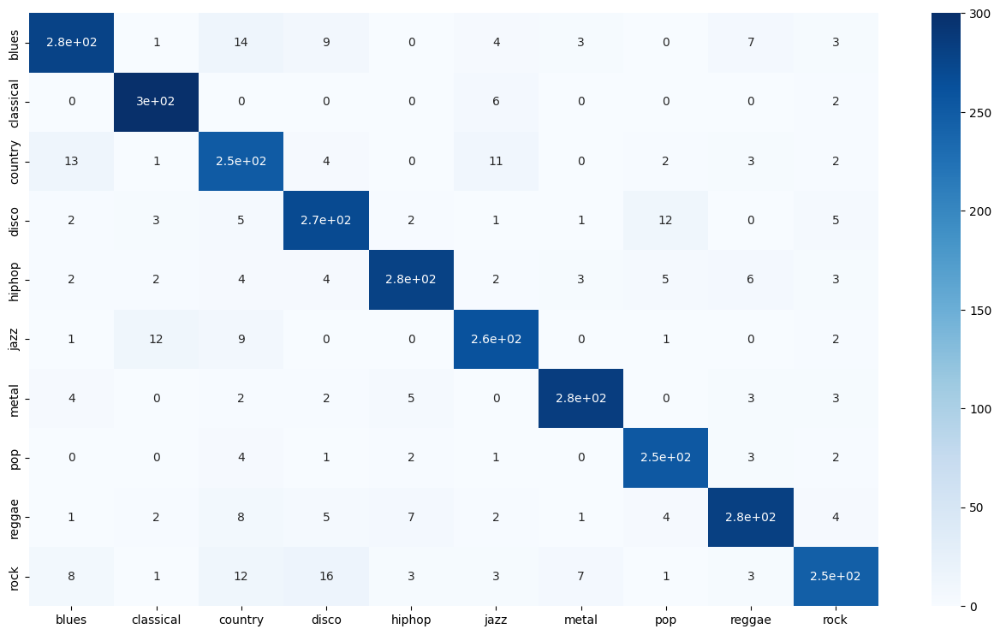

In [91]:
confusion_matr = confusion_matrix(y_test, preds) 
plt.figure(figsize = (16, 9))
sns.heatmap(confusion_matr, cmap="Blues", annot=True, 
            xticklabels = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"],
           yticklabels=["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]);

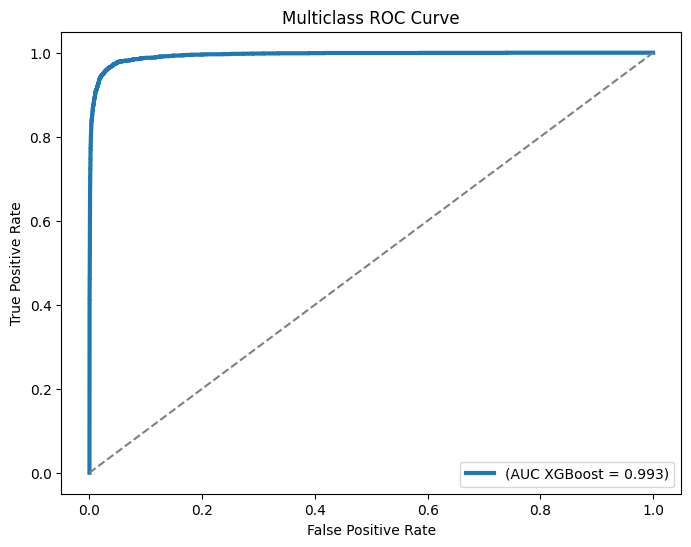

In [112]:
from sklearn.preprocessing import label_binarize

y_preds = xgb.predict_proba(X_test)
y_test_binary = label_binarize(y_test, classes=np.arange(y_preds.shape[1]))

fpr, tpr, _ = roc_curve(
    y_test_binary.ravel(),
    y_preds.ravel(),
)
best_auc = roc_auc_score(
    y_test_binary,
    y_preds,
    multi_class='ovr',
    average='macro',
)

plt.figure(figsize=(8, 6))
plt.plot(
    fpr,
    tpr,
    linewidth=3,
    label=f"(AUC XGBoost = {best_auc:.3f})",
)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC Curve')
plt.legend(loc='lower right')
plt.show()


In [92]:
import IPython.display as ipd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing


In [93]:
data=pd.read_csv(f'Data/features_30_sec.csv',index_col='filename')
labels=data[['label']]
data=data.drop(columns=['length','label'])
data.head()


,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,...,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035
blues.00001.wav,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,...,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282
blues.00002.wav,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,...,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025
blues.00003.wav,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,...,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339
blues.00004.wav,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,...,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160


In [94]:
data_scaled=preprocessing.scale(data)
print('Scaled data type:', type(data_scaled))

Scaled data type: <class 'numpy.ndarray'>


In [95]:
similarity=cosine_similarity(data_scaled)
print("Similarity: ",similarity.shape)


Similarity:  (1000, 1000)


In [96]:
sim_df_labels = pd.DataFrame(similarity)
sim_df_names = sim_df_labels.set_index(labels.index)
sim_df_names.columns = labels.index

In [97]:
sim_df_names.head()

filename,blues.00000.wav,blues.00001.wav,blues.00002.wav,blues.00003.wav,blues.00004.wav,blues.00005.wav,blues.00006.wav,blues.00007.wav,blues.00008.wav,blues.00009.wav,...,rock.00090.wav,rock.00091.wav,rock.00092.wav,rock.00093.wav,rock.00094.wav,rock.00095.wav,rock.00096.wav,rock.00097.wav,rock.00098.wav,rock.00099.wav
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,1.000000,0.049231,0.589618,0.284862,0.025561,-0.346688,-0.219483,-0.167626,0.641877,-0.097889,...,-0.082829,0.546169,0.578558,0.662590,0.571629,0.610942,0.640835,0.496294,0.284958,0.304098
blues.00001.wav,0.049231,1.000000,-0.096834,0.520903,0.080749,0.307856,0.318286,0.415258,0.120649,0.404168,...,-0.098111,-0.325126,-0.370792,-0.191698,-0.330834,-0.077301,-0.222119,-0.302573,0.499562,0.311723
blues.00002.wav,0.589618,-0.096834,1.000000,0.210411,0.400266,-0.082019,-0.028061,0.104446,0.468113,-0.132532,...,-0.032408,0.561074,0.590779,0.583293,0.514537,0.495707,0.566837,0.589983,0.216378,0.321069
blues.00003.wav,0.284862,0.520903,0.210411,1.000000,0.126437,0.134796,0.300746,0.324566,0.352758,0.295184,...,-0.320107,-0.206516,-0.151132,0.041986,-0.172515,-0.000287,0.020515,-0.107821,0.502279,0.183210
blues.00004.wav,0.025561,0.080749,0.400266,0.126437,1.000000,0.556066,0.482195,0.623455,0.029703,0.471657,...,0.087605,0.017366,0.138035,0.104684,-0.034594,0.063454,0.063546,0.172944,0.153192,0.061785


In [98]:
def find_similar_song(name):
    series=sim_df_names[name].sort_values(ascending=False)
    series=series.drop(name)
    print("\n*****\nSimilar song to ",name)
    print(series.head(5))

In [103]:
find_similar_song('pop.00019.wav')
ipd.Audio(f'Data/genres_original/pop/pop.00019.wav')


*****
Similar song to  pop.00019.wav
filename
pop.00023.wav    0.862836
pop.00034.wav    0.860499
pop.00078.wav    0.829135
pop.00088.wav    0.824456
pop.00091.wav    0.802269
Name: pop.00019.wav, dtype: float64


In [104]:
ipd.Audio(f'Data/genres_original/pop/pop.00023.wav')

In [105]:
ipd.Audio(f'Data/genres_original/pop/pop.00034.wav')

In [106]:
ipd.Audio(f'Data/genres_original/pop/pop.00078.wav')

In [107]:
ipd.Audio(f'Data/genres_original/pop/pop.00088.wav')